In [1]:
import numpy as np

import deepxde as dde
import matplotlib.pyplot as plt

Using TensorFlow 2 backend.

Instructions for updating:
non-resource variables are not supported in the long term


In [2]:
def gen_testdata():
    data = np.load("Burgers.npz")
    t, x, exact = data["t"], data["x"], data["usol"].T
    xx, tt = np.meshgrid(x, t)
    X = np.vstack((np.ravel(xx), np.ravel(tt))).T
    y = exact.flatten()[:, None]
    return X, y

In [3]:
def pde(x, y):
    dy_x = dde.grad.jacobian(y, x, i=0, j=0)
    dy_t = dde.grad.jacobian(y, x, i=0, j=1)
    dy_xx = dde.grad.hessian(y, x, i=0, j=0)
    return dy_t + y * dy_x - 0.01 / np.pi * dy_xx

In [4]:
geom = dde.geometry.Interval(-1, 1)
timedomain = dde.geometry.TimeDomain(0, 0.99)
geomtime = dde.geometry.GeometryXTime(geom, timedomain)

In [5]:
bc = dde.DirichletBC(geomtime, lambda x: 0, lambda _, on_boundary: on_boundary)
ic = dde.IC(
        geomtime, lambda x: -np.sin(np.pi * x[:, 0:1]), lambda _, on_initial: on_initial
)

In [6]:
data = dde.data.TimePDE(
        geomtime, pde, [bc, ic], num_domain=2540, num_boundary=80, num_initial=160
)
net = dde.maps.FNN([2] + [20] * 3 + [1], "tanh", "Glorot normal")
model = dde.Model(data, net)

In [7]:
model.compile("adam", lr=1e-3)
model.train(epochs=1500)
model.compile("L-BFGS-B")
losshistory, train_state = model.train()

Compiling model...
Building feed-forward neural network...
'build' took 0.113823 s

C:\Users\nilso\Anaconda3\lib\site-packages\tensorflow\python\keras\legacy_tf_layers\core.py:171: UserWarning: `tf.layers.dense` is deprecated and will be removed in a future version. Please use `tf.keras.layers.Dense` instead.
  warnings.warn('`tf.layers.dense` is deprecated and '
C:\Users\nilso\Anaconda3\lib\site-packages\tensorflow\python\keras\engine\base_layer_v1.py:1719: UserWarning: `layer.apply` is deprecated and will be removed in a future version. Please use `layer.__call__` method instead.
  warnings.warn('`layer.apply` is deprecated and '
'compile' took 1.938441 s

Initializing variables...
Training model...

Step      Train loss                        Test loss                         Test metric
0         [3.24e-03, 8.62e-02, 7.52e-01]    [3.24e-03, 0.00e+00, 0.00e+00]    []  
1000      [4.07e-02, 1.11e-03, 5.89e-02]    [4.07e-02, 0.00e+00, 0.00e+00]    []  
1500      [3.44e-02, 3.58e-04, 4

Saving loss history to loss.dat ...
Saving training data to train.dat ...
Saving test data to test.dat ...


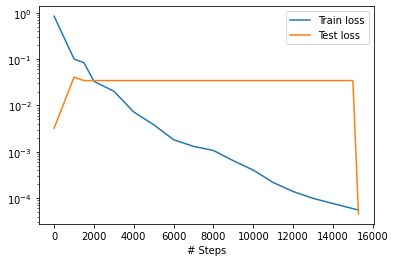

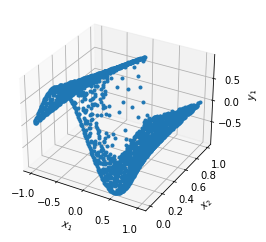

In [8]:
dde.saveplot(losshistory, train_state, issave=True, isplot=True)

In [9]:
X, y_true = gen_testdata()
y_pred = model.predict(X)
f = model.predict(X, operator=pde)

print("Mean residual:", np.mean(np.absolute(f)))
print("L2 relative error:", dde.metrics.l2_relative_error(y_true, y_pred))

np.savetxt("test.dat", np.hstack((X, y_true, y_pred)))

Predicting...
'predict' took 0.029986 s

Predicting...
'predict' took 0.112085 s

Mean residual: 0.009296791
L2 relative error: 0.017051363842202592


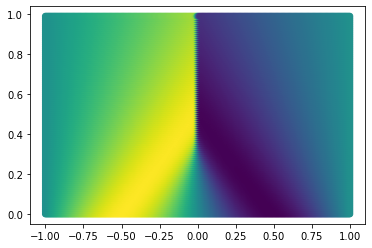

In [11]:
plt.scatter(X[:,0],X[:,1],c=y_true)

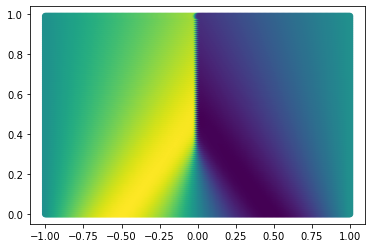

In [12]:
plt.scatter(X[:,0],X[:,1],c=y_pred)

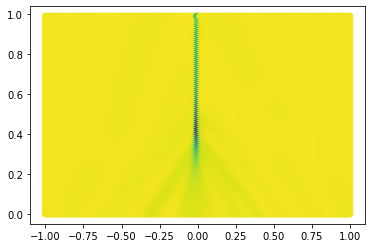

In [13]:
plt.scatter(X[:,0],X[:,1],c=y_pred-y_true)

In [14]:
import pandas as pd

In [16]:
df = pd.DataFrame(columns={'X','Y','Z'})

In [17]:
df['X'] = X[:,0]
df['Y'] = X[:,1]
df['Z'] = y_true

In [20]:
df_value = df.pivot(values='Z',index='Y',columns='X')

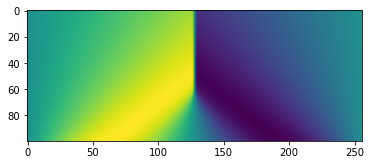

In [23]:
plt.imshow(df_value.sort_index(ascending=False).values)